In [1]:
! free -h

              total        used        free      shared  buff/cache   available
Mem:           23Gi       288Mi        23Gi        48Mi       149Mi        22Gi
Swap:         6.0Gi       280Mi       5.7Gi


# libs

In [88]:
import os
import pandas as pd
import tqdm
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import multiprocessing as mp
import nltk
import string
import re
import matplotlib.pyplot as plt
import seaborn as sns
from utils.text_preprocessing import *

# EDA

In [58]:
classes_base = pd.read_csv('./first-statistics/DP Datsets - Классы и датасеты.csv')

In [11]:
classes_base = pd.read_csv('./first-statistics/DP Datsets - classes base.csv')
classes_base = classes_base['our topics'].str.lower().unique()
classes_base = [i.replace(' ','') for i in classes_base]

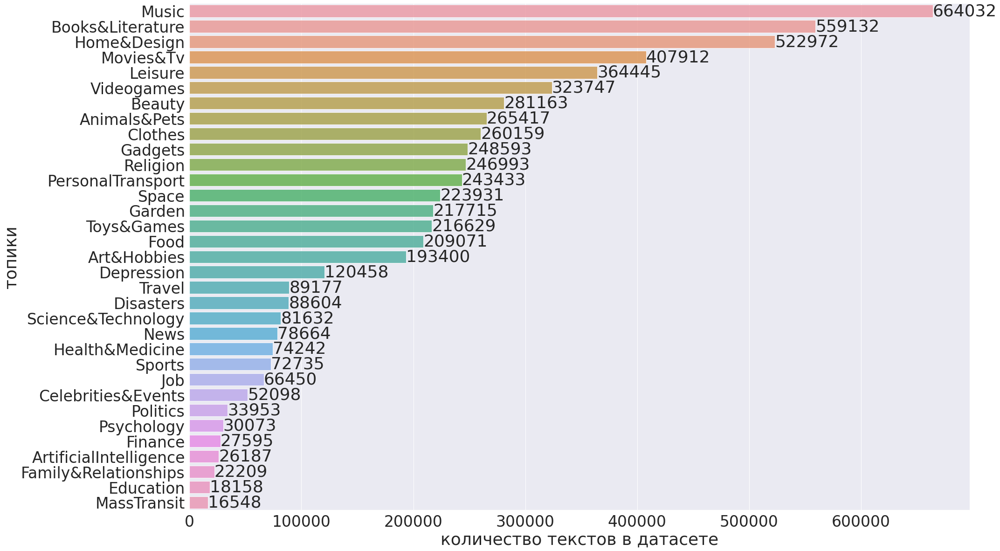

In [32]:
class_distr = res.topic.value_counts().reset_index()
plt.figure(figsize=(30,20))
sns.set(font_scale=3)
ax = sns.barplot( y = class_distr['index'],x = class_distr['topic'], alpha=0.8)
plt.ylabel('топики')
plt.xlabel('количество текстов в датасете')
ax.bar_label(ax.containers[0])

plt.show()

In [20]:
res['lens'] = res.new_text.str.split().apply(len)
damn = res['lens'].value_counts().reset_index()

kek = list()
for i in range(10,100,10):
    l = damn[(damn['index']>i) & (damn['index']<=i+10)].lens.sum()
    kek.append({'index':f'от {i} до {i+10}','lens':l })

token1 = damn[(damn['index']<=10)]
token1 = token1.sort_values('index')

token2 = pd.DataFrame(kek)

token3 = pd.DataFrame([{'index':"> 100",
                        'lens': damn[(damn['index']>100)].lens.sum()
                       }])

token = pd.concat([token1,token2,token3])

In [ ]:
plt.figure(figsize=(30,20))
sns.set(font_scale=3)
ax = sns.barplot( y = token['index'],x = token['lens'], alpha=0.8)
ax.bar_label(ax.containers[0])
plt.xlabel('количество текстов')
plt.ylabel('количество токенов в тексте')
ax.ticklabel_format(style='plain', axis='x')
plt.show()

# sample topic

In [8]:
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
import tqdm
import pyLDAvis
import spacy

mallet_path = './mallet-2.0.8/bin/mallet/'

In [ ]:
id2word = corpora.Dictionary(data_ready)
print('Total Vocabulary Size:', len(id2word))
corpus = [id2word.doc2bow(text) for text in data_ready]

In [41]:
corp_wc = p[p.topic=='food'].text.str.lower()
corp = corp_wc.str.split().tolist()

In [42]:
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

allowed_tags=['NOUN', 'ADJ', 'VERB', 'ADV']

corp_wc = corp_wc.reset_index()

In [43]:
def lemmatizer(col):
    doc = nlp(col) 
    return ' '.join([token.lemma_ for token in doc if token.pos_ in allowed_tags])

In [44]:
%%time
with mp.Pool(mp.cpu_count()) as pool:
        corp_wc['text_out'] = pool.map(lemmatizer, corp_wc['text'])

CPU times: user 583 ms, sys: 800 ms, total: 1.38 s
Wall time: 2min 57s


In [45]:
corp_wc_str = ' '.join(corp_wc['text_out'].tolist())

In [46]:
%%time
data_ready = corp_wc['text_out'].str.split().tolist()

id2word = corpora.Dictionary(data_ready)
print('Total Vocabulary Size:', len(id2word))
corpus = [id2word.doc2bow(text) for text in data_ready]

Total Vocabulary Size: 66769
CPU times: user 16.6 s, sys: 403 ms, total: 17 s
Wall time: 17 s


In [48]:
dict_corpus = {}

for i in tqdm.tqdm_notebook(range(len(corpus))):
    for idx, freq in corpus[i]:
        if id2word[idx] in dict_corpus:
            dict_corpus[id2word[idx]] += freq
        else:
            dict_corpus[id2word[idx]] = freq

/tmp/ipykernel_33371/1092252593.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm.tqdm_notebook(range(len(corpus))):


  0%|          | 0/299794 [00:00<?, ?it/s]

In [49]:
dict_df = pd.DataFrame.from_dict(dict_corpus, orient='index', columns=['freq'])

<AxesSubplot:xlabel='freq', ylabel='Density'>

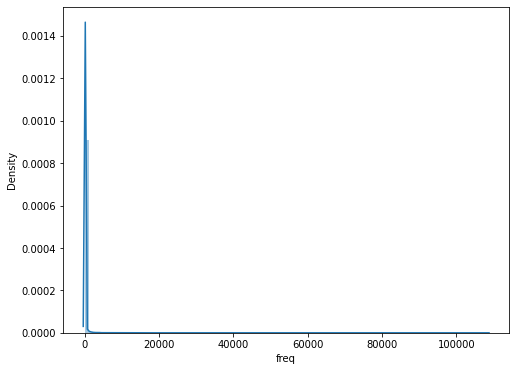

In [50]:
plt.figure(figsize=(8,6))
sns.distplot(dict_df['freq'], bins=100)

In [57]:
dict_df.sort_values('freq', ascending=False).head(10)

,freq
good,108412
taste,90715
great,79090
tea,70658
flavor,69862
use,69430
love,64641
make,58297
product,51379
buy,47163


In [52]:
%%time
ldamallet = gensim.models.LdaModel(corpus=corpus,
                                             num_topics=20,
                                             id2word=id2word)

CPU times: user 1min 53s, sys: 2.9 s, total: 1min 56s
Wall time: 1min 52s


In [54]:
%%time
tm_results = ldamallet[corpus]
corpus_topics = [sorted(topics, key=lambda record: -record[1])[0] for topics in tm_results]
topics = [
    [(term, round(wt, 3)) for term, wt in ldamallet.show_topic(n, topn=20)]
    for n in range(0, ldamallet.num_topics)]

CPU times: user 1min 39s, sys: 2.35 s, total: 1min 41s
Wall time: 1min 38s


In [55]:
topics_df = pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics],
                         columns = ['Terms per Topic'],
                         index=['Topic'+str(t) for t in range(1, ldamallet.num_topics+1)])

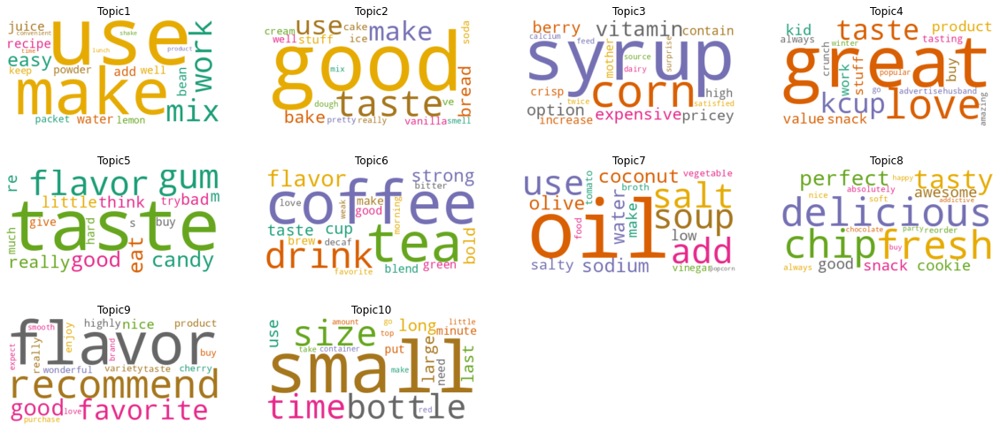

In [56]:
from wordcloud import WordCloud

# initiate wordcloud object
wc = WordCloud(background_color="white", colormap="Dark2", max_font_size=150, random_state=42)

# set the figure size
plt.rcParams['figure.figsize'] = [20, 15]

# Create subplots for each topic
for i in range(10):

    wc.generate(text=topics_df["Terms per Topic"][i])
    
    plt.subplot(5, 4, i+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(topics_df.index[i])

plt.show()

In [ ]:
import pyLDAvis.gensim_models as gensimvis
vis_data = gensimvis.prepare(ldamallet, corpus, id2word, sort_topics=False)
pyLDAvis.display(vis_data)

In [27]:
res['token_lens_'] = res.new_text_.apply(len)

In [28]:
damn  = res['token_lens_'].value_counts().reset_index()

`(t.text+'******'+ t.topic+ '******'+ t.new_text_.astype(str)).tolist()`

убрать CatastrophicFailure


In [76]:
test = df.token_lens.value_counts().reset_index()

In [55]:
top_topics = l[l.topic>100_000]['index'].values

part1 = df_for_train[df_for_train.topic.isin(top_topics)==False]



test = test.sample(frac=1)

p2 = res_res[res_res.topic.isin(t)==False]

for i in t:
    temp = res_res[res_res.topic==i].sample(200_000)
    p2 = pd.concat([p2,temp])

class_distr = p2.topic.value_counts().reset_index()
plt.figure(figsize=(30,20))
sns.set(font_scale=3)
ax = sns.barplot( y = class_distr['index'],x = class_distr['topic'], alpha=0.8)
plt.ylabel('топики')
plt.xlabel('количество текстов в датасете')
ax.bar_label(ax.containers[0])

plt.show()

p2.to_csv('./dataset-train-data/dataset_v7.csv', index=False)

res_res[['text','topic']].to_csv('./dataset-train-data/dataset_v7_extended.csv', index=False)

# post analysis

In [2]:
df = pd.read_csv('./dataset-train-data/dataset_v8.csv')

In [4]:
%%time

df = main(df,'text', 'text_for_analysis')

text preprocessed
CPU times: user 2.67 s, sys: 1.58 s, total: 4.25 s
Wall time: 1min 11s


In [6]:
%%time
df.text_for_analysis = df.text_for_analysis.str.lower()

In [12]:
%%time
data_ready = df.text_for_analysis.str.split().tolist()

CPU times: user 16.4 s, sys: 1.18 s, total: 17.6 s
Wall time: 17.5 s


In [48]:
topics_ = res.topic.unique()

topics_

array(['Celebrities&Events', 'Travel', 'MassTransit', 'Leisure', 'Beauty',
       'Health&Medicine', 'ArtificialIntelligence', 'Depression',
       'Disasters', 'Finance', 'Job', 'Psychology', 'Religion', 'Space',
       'Music', 'Movies&Tv', 'Sports', 'Clothes', 'Food',
       'Books&Literature', 'Videogames', 'Garden', 'Toys&Games',
       'PersonalTransport', 'Home&Design', 'Gadgets', 'Art&Hobbies',
       'Animals&Pets', 'Family&Relationships', 'News', 'Politics',
       'Science&Technology', 'Education'], dtype=object)

In [55]:
res['lens_text'] = res.text.str.split().apply(len)

In [60]:
test = res[(res.lens>=5) & (res.lens_text<=70)]

In [69]:
test = test[test.origin_topic!='transition_music_movies']

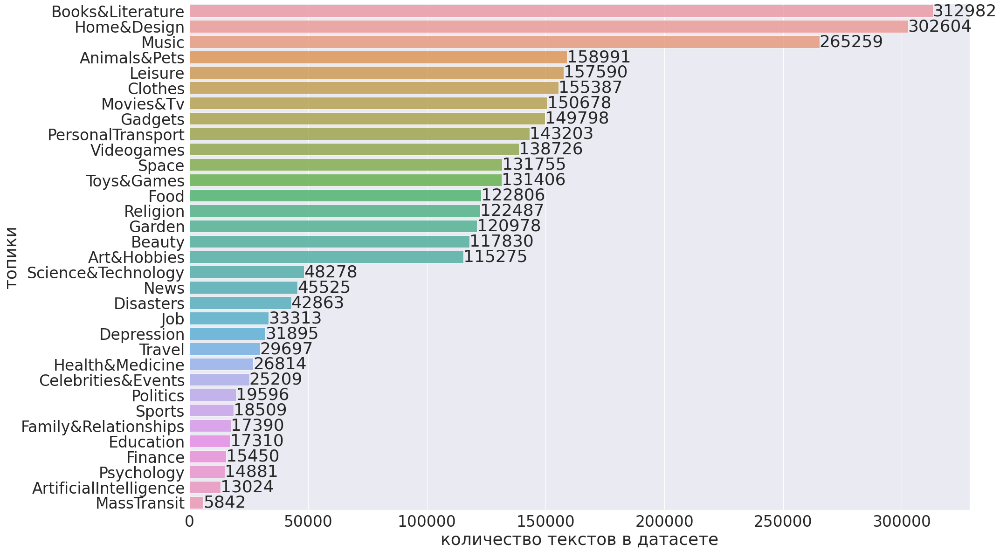

In [89]:
class_distr = test.topic.value_counts().reset_index()
plt.figure(figsize=(30,20))
sns.set(font_scale=3)
ax = sns.barplot( y = class_distr['index'],x = class_distr['topic'], alpha=0.8)
plt.ylabel('топики')
plt.xlabel('количество текстов в датасете')
ax.bar_label(ax.containers[0])

plt.show()

In [93]:
l = test.topic.value_counts().reset_index()
top_topics = l[l.topic>100_000]['index'].values

test_down = test[test.topic.isin(top_topics)==False]
test = test.sample(frac=1)
for i in top_topics:
    temp = test[test.topic==i].sample(100_000)
    test_down = pd.concat([test_down,temp])

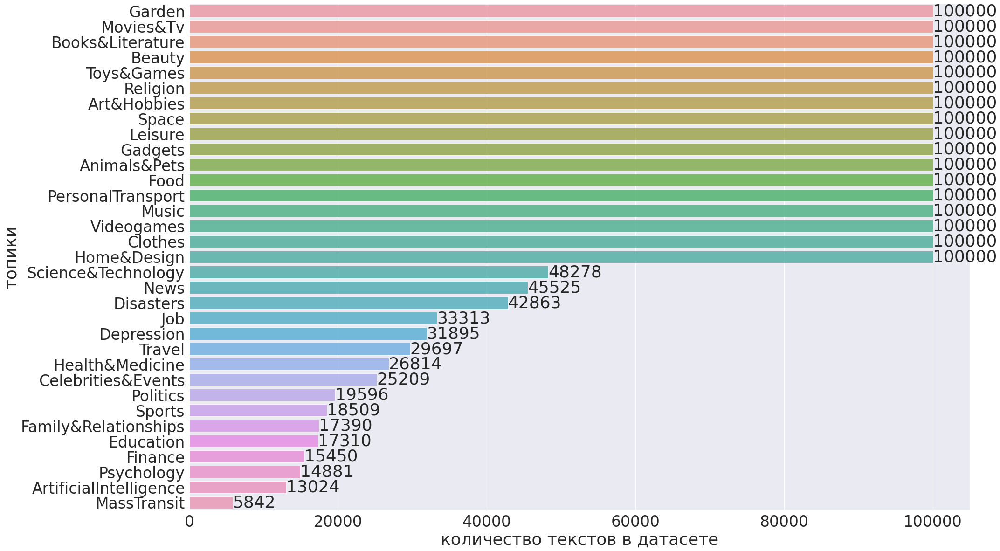

In [96]:
class_distr = test_down.topic.value_counts().reset_index()
plt.figure(figsize=(30,20))
sns.set(font_scale=3)
ax = sns.barplot( y = class_distr['index'],x = class_distr['topic'], alpha=0.8)
plt.ylabel('топики')
plt.xlabel('количество текстов в датасете')
ax.bar_label(ax.containers[0])

plt.show()

In [ ]:
test_down.to_csv()

In [98]:
test_down[['text','topic']].to_csv('./dataset-train-data/dataset_v6_downsampled.csv', index=False)

In [64]:
for i in res.topic.unique():
    print('**'*40)
    print(i)
    print(res[res.topic==i].origin_topic.unique())

********************************************************************************
Celebrities&Events
['entertainment' 'celebrities' 'CelebBattles' 'CelebrityCandids' 'Celebs']
********************************************************************************
Travel
['Hotels & Travel, Trains, Transportation'
 'Hotels & Travel, Event Planning & Services, Hotels'
 'Hotels & Travel, Hotels, Event Planning & Services'
 'Hotels & Travel, Car Rental' 'Hotels & Travel, Tours'
 'Hotels & Travel, Automotive, Car Rental, Auto Loan Providers'
 'Hotels & Travel, Event Planning & Services, Restaurants, Hotels'
 'Hotels & Travel, Transportation, Taxis'
 'Hotels & Travel, Event Planning & Services, Hotels, Resorts'
 'Hotels & Travel, Hotels, Venues & Event Spaces, Event Planning & Services'
 'Hotels & Travel, Hotels, Event Planning & Services, Venues & Event Spaces'
 'Hotels & Travel, Nightlife, Food, Bars, Beer Bar, Breweries, Tours, Beer Tours'
 'Hotels & Travel, Local Services, Transportation, Taxis, 

['Nightlife, Wine Bars, Restaurants, Mexican, Bars, Beer Bar'
 'Wine Bars, Spanish, Tapas Bars, Bars, Restaurants, Nightlife'
 'Nightlife, Wine Bars, Cocktail Bars, Bars, Italian, Restaurants' ...
 "['attraction', 'bus', 'train']"
 "['attraction', 'taxi', 'train', 'hotel']"
 'X wants to know what activities Y likes to do during weekends.']
********************************************************************************
Beauty
['Cosmetics & Beauty Supply, Hair Salons, Beauty & Spas, Day Spas, Shopping, Specialty Schools, Cosmetology Schools, Education, Hair Removal'
 'Beauty & Spas, Hair Salons'
 'Nail Salons, Waxing, Beauty & Spas, Hair Removal, Eyelash Service' ...
 'Beauty & Spas, Nail Salons, Hair Removal, Cosmetics & Beauty Supply, Hair Salons, Shopping, Waxing'
 'Luxury Beauty' 'All Beauty']
********************************************************************************
Health&Medicine
['Health & Medical, Laser Eye Surgery/Lasik, Ophthalmologists, Optometrists, Doctors'
 'Medical

['Video Games' 'leagueoflegends' 'videogames' 'DotA2' 'GlobalOffensive']
********************************************************************************
Garden
['Patio Lawn and Garden']
********************************************************************************
Toys&Games
['Toys and Games']
********************************************************************************
PersonalTransport
['Automotive']
********************************************************************************
Home&Design
['Appliances' 'Tools and Home Improvement' 'Home and Kitchen']
********************************************************************************
Gadgets
['Cell Phones and Accessories']
********************************************************************************
Art&Hobbies
['Arts Crafts and Sewing']
********************************************************************************
Animals&Pets
['Pet Supplies']
********************************************************************************

In [49]:
from wordcloud import WordCloud

  0%|          | 0/33 [00:00<?, ?it/s]

************************************************************
Celebrities&Events

            index  new_text
0          people      6494
1            vote      4029
2            time      2352
3           thing      2213
4            year      2098
5          action      1935
6             bot      1773
7            shit      1717
8   automatically      1699
9       performed      1676
10          woman      1632
11          movie      1460
12           fuck      1436
13            man      1375
14            lol      1335
15           love      1330
16          music      1315
17            guy      1291
18          rogan      1203
19           life      1184


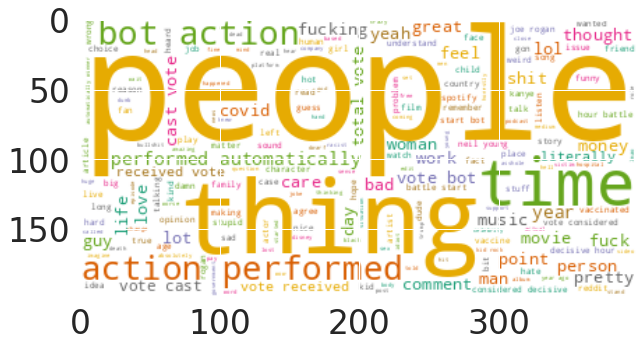



************************************************************
Travel

         index  new_text
0         room     81491
1        hotel     64220
2          car     47750
3         time     44989
4      service     34489
5        great     33903
6         stay     31663
7          day     30316
8        place     30135
9         nice     26460
10       staff     25743
11       night     23872
12     airport     20671
13       clean     20098
14        hour     18889
15      people     18762
16    location     18592
17  experience     18012
18      minute     17949
19        told     17855


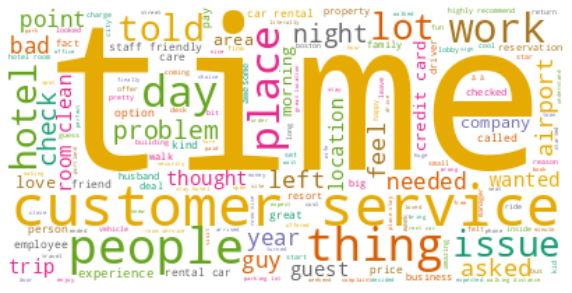



************************************************************
MassTransit

         index  new_text
0         time     12865
1          bus      9547
2      service      7386
3         ride      6819
4       flight      6638
5       driver      6481
6          car      5561
7          day      5550
8         hour      5540
9       minute      5225
10        park      5089
11      people      4778
12     airport      4422
13      disney      3799
14       great      3719
15        trip      3706
16    customer      3509
17       train      3465
18  experience      3439
19     company      3437


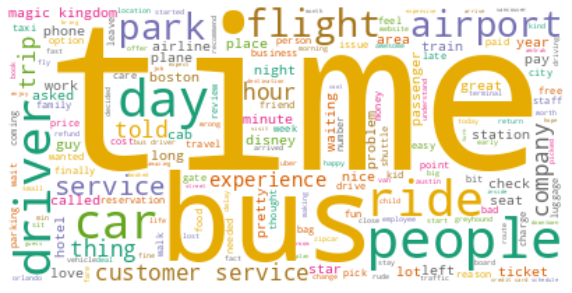



************************************************************
Leisure

         index  new_text
0         food    255769
1        place    224901
2        great    200657
3         time    147622
4      service    144531
5        drink    132321
6          bar    130916
7   restaurant     93645
8         menu     82363
9        table     81656
10       night     81265
11     ordered     78801
12        nice     78517
13        beer     76049
14      friend     67119
15       order     65427
16   delicious     63135
17     chicken     58897
18        love     58237
19       staff     57349


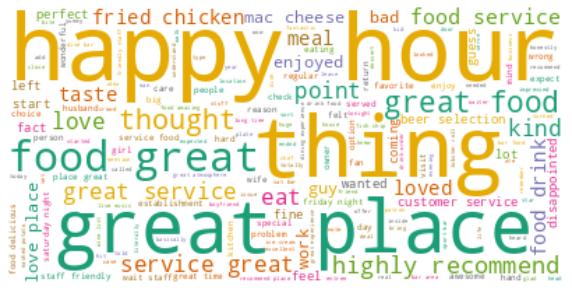



************************************************************
Beauty

          index  new_text
0          hair    219218
1          nail    169939
2          time    157280
3         great    125868
4         salon    125246
5         place    115176
6           cut     98560
7       service     75764
8         color     65702
9   appointment     62927
10   experience     60059
11          job     58223
12         love     56765
13          day     56286
14      massage     55539
15         year     54033
16         nice     53829
17         work     53459
18     pedicure     52371
19      stylist     50187


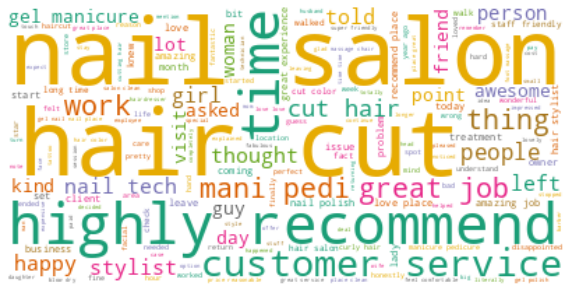



************************************************************
Health&Medicine

          index  new_text
0          time     43924
1        doctor     30252
2         staff     27039
3   appointment     25432
4          care     24929
5         great     24812
6        office     24001
7         place     21435
8          year     21153
9    experience     19440
10      massage     19372
11          day     19034
12      patient     18797
13         work     17181
14         told     16196
15         feel     15369
16    recommend     15285
17      service     15226
18         pain     14977
19      dentist     13341


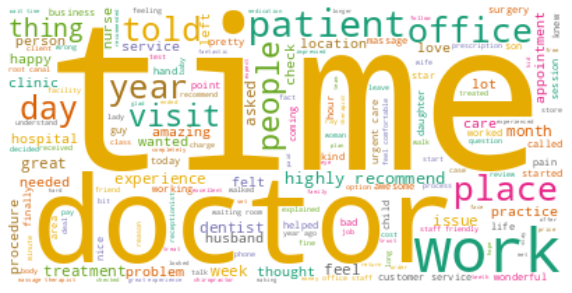



************************************************************
ArtificialIntelligence

       index  new_text
0      model      7579
1       data      5481
2   learning      4746
3         ai      3972
4       work      3750
5      paper      3705
6          1      3623
7      image      3362
8       time      3348
9    problem      2900
10         2      2663
11         0      2567
12  training      2482
13      code      2382
14     thing      2167
15    action      2134
16         3      1968
17    people      1949
18     agent      1922
19  question      1909


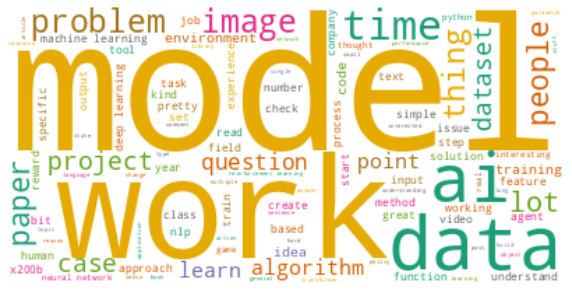



************************************************************
Depression

      index  new_text
0      feel    122490
1      life    120251
2      time     87488
3      year     75836
4    people     74865
5    friend     71589
6     thing     67715
7       day     59688
8   thought     44415
9       die     38400
10   family     38238
11  fucking     36726
12  suicide     36176
13     kill     35909
14     live     35044
15     love     32967
16   school     32827
17     work     32579
18     care     31611
19     hate     30870


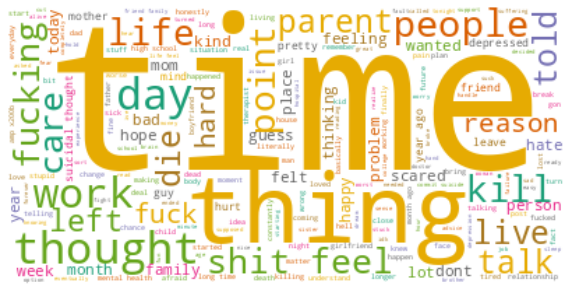



************************************************************
Disasters

        index  new_text
0      people      6615
1        time      5528
2        year      4151
3       thing      4010
4       video      3332
5       water      2942
6       plane      2858
7    building      2783
8         day      2743
9         car      2598
10        lot      2457
11      pilot      2272
12       shit      2256
13      train      2228
14       work      2144
15  explosion      2141
16        guy      2022
17     pretty      1993
18       yeah      1981
19   happened      1885


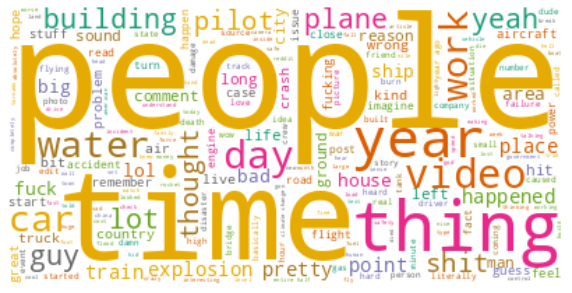



************************************************************
Finance

         index  new_text
0       people      5374
1         year      3265
2        money      3148
3       market      2418
4    inflation      2301
5         time      2279
6        price      2237
7         work      2083
8      company      2030
9        thing      1789
10         pay      1762
11         tax      1698
12        rate      1692
13         job      1670
14  government      1558
15       stock      1314
16     economy      1293
17       china      1263
18        debt      1217
19         lot      1215


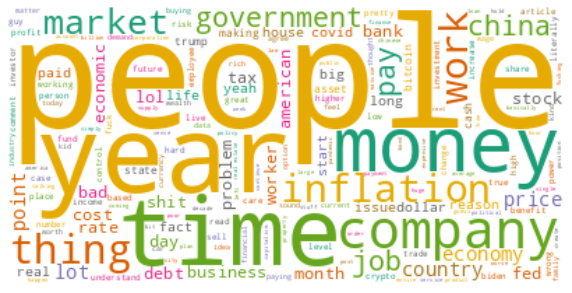



************************************************************
Job

         index  new_text
0          job     33759
1         work     22328
2      company     15976
3         time     15704
4       people     13269
5         year     12662
6        thing      8561
7          day      8456
8   experience      8222
9    interview      8078
10     working      6713
11         pay      6397
12     manager      6327
13        feel      6255
14         lot      6235
15        week      6111
16        role      5905
17    position      5853
18       month      5770
19           2      5503


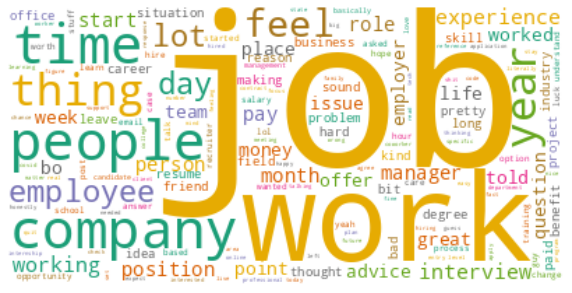



************************************************************
Psychology

         index  new_text
0       people      8469
1         time      5002
2        thing      4773
3         work      4417
4        study      3963
5   psychology      3667
6         feel      2903
7          lot      2852
8     behavior      2735
9       person      2723
10  experience      2688
11    question      2611
12        year      2560
13        life      2320
14      social      2306
15        hour      1957
16    disorder      1912
17       point      1896
18      school      1831
19        read      1797


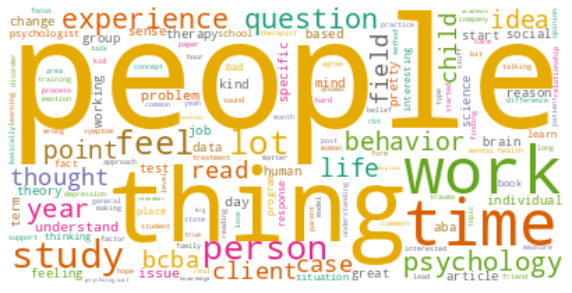



************************************************************
Religion

        index  new_text
0         god    145597
1      people     62710
2       jesus     52620
3       thing     42912
4   christian     39751
5        time     35121
6      church     34694
7       bible     33028
8        life     32695
9         sin     27764
10     christ     24368
11   religion     24359
12       love     22362
13      faith     21818
14          1     20085
15        day     18713
16        man     17881
17       year     17815
18      point     17210
19       work     16911


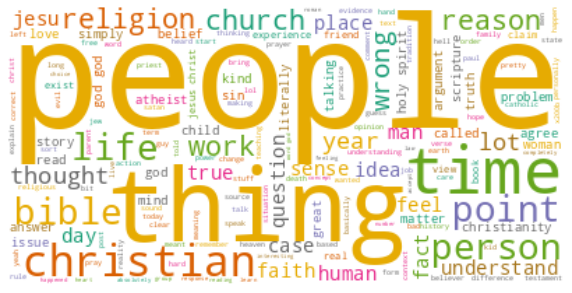



************************************************************
Space

       index  new_text
0     spacex     42713
1     launch     33337
2       time     25385
3      space     25273
4   starship     24677
5    comment     18289
6     engine     17448
7       year     16897
8      thing     16135
9       nasa     15646
10    rocket     14709
11     orbit     14685
12    people     14502
13   landing     13839
14     earth     13693
15         1     13518
16     usage     13450
17    flight     13326
18      stub     13241
19         2     12738


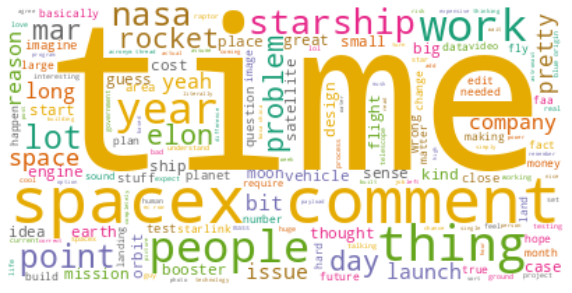



************************************************************
Music

       index  new_text
0      album    505731
1       song    466771
2      great    254692
3      music    206172
4      sound    202812
5       time    166220
6       love    154958
7     guitar    138702
8      track    135402
9       band    133360
10      rock    117846
11      work    103780
12      year     88249
13       fan     75469
14       hit     68024
15  favorite     65924
16   classic     64460
17   version     62409
18     thing     61942
19    listen     60770


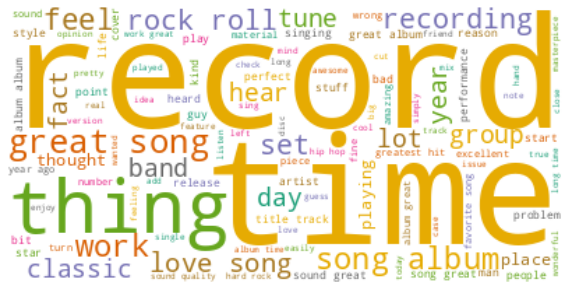



************************************************************
Movies&Tv

        index  new_text
0       movie    330760
1        film    229252
2       great    101809
3        time     95251
4       story     72768
5        love     65984
6         dvd     57366
7   character     54675
8       scene     51465
9       watch     46725
10       year     46223
11       star     41435
12       life     39930
13    classic     37905
14     people     34156
15    version     32671
16      actor     32562
17        man     32040
18      thing     31456
19       play     28597


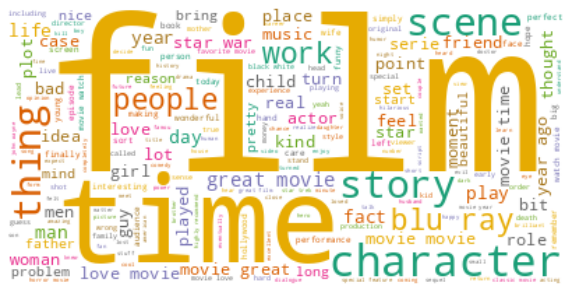



************************************************************
Sports

          index  new_text
0          year      6148
1          team      5815
2          game      5742
3          yeah      5505
4        season      3180
5        player      2628
6           nfl      2330
7          play      2243
8           win      2195
9         great      2047
10         time      2033
11          fan      1705
12     football      1609
13          lot      1385
14        watch      1324
15        super      1163
16      patriot      1158
17         bowl      1153
18       pretty      1127
19  quarterback      1108


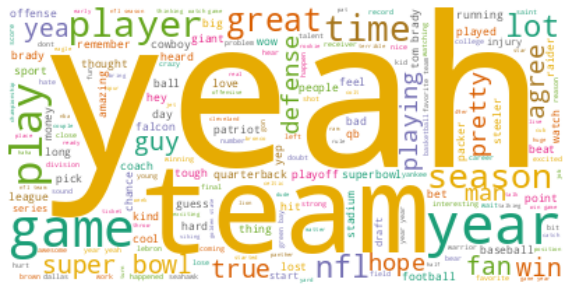



************************************************************
Clothes

          index  new_text
0          size     67931
1         great     63862
2          shoe     59768
3          wear     54651
4          love     52178
5   comfortable     42825
6          pair     35559
7         color     29214
8          nice     28963
9       quality     28483
10         time     26908
11        shirt     25521
12         year     24588
13      perfect     24487
14         work     24000
15         foot     23900
16         boot     23261
17      ordered     22334
18        small     22224
19            5     21523


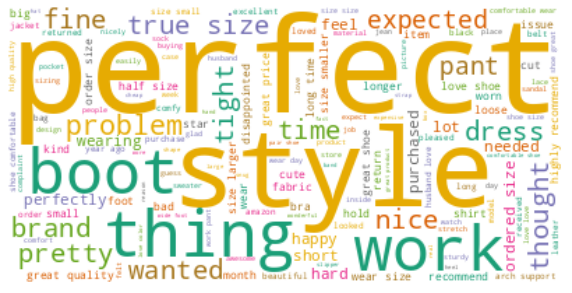



************************************************************
Food

        index  new_text
0       taste     60606
1         tea     56383
2       great     54991
3      flavor     50283
4        love     44292
5     product     36854
6        time     23533
7       price     22012
8      coffee     19702
9         bag     19503
10      sugar     17691
11      brand     15514
12  delicious     15319
13        add     15187
14     amazon     15075
15       food     14591
16      store     14134
17  chocolate     13866
18   favorite     13635
19        eat     13499


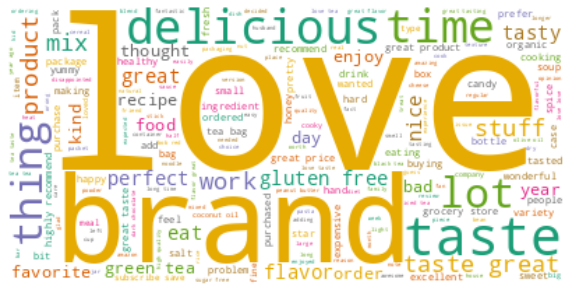



************************************************************
Books&Literature

        index  new_text
0        book    766387
1        read    367245
2       story    358281
3   character    210228
4        love    164713
5        time    153811
6       great    138489
7      series    137066
8     reading    124938
9      author    111910
10       life    107701
11      thing     72959
12      loved     67854
13       year     65226
14    enjoyed     65221
15     people     64443
16    written     63744
17     reader     60268
18       work     58425
19        lot     53893


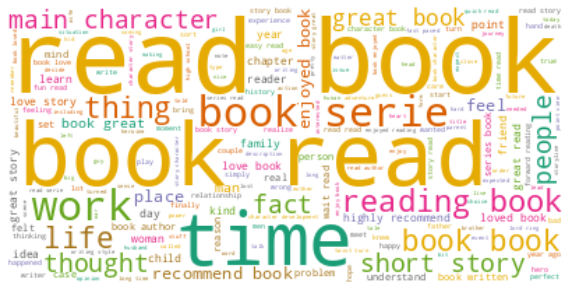



************************************************************
Videogames

        index  new_text
0        game    876435
1        play    154849
2        time    147031
3       great    115036
4         fun    107597
5   character     86289
6       thing     79214
7           2     77838
8     graphic     77364
9       story     74405
10    playing     68064
11      level     67237
12     player     65324
13        lot     63454
14          3     58190
15     played     57886
16       work     52690
17       love     50599
18     people     50485
19       feel     48642


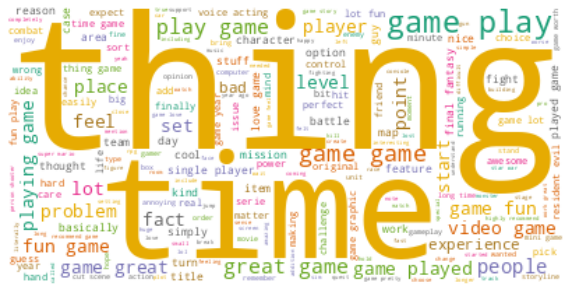



************************************************************
Garden

      index  new_text
0      work     57901
1     great     51663
2   product     35943
3      time     33595
4      year     32449
5      easy     28669
6     water     25909
7     plant     19785
8      hose     19701
9         2     19607
10    price     19080
11     love     18442
12      day     17531
13   feeder     17461
14     nice     16439
15     pool     16077
16    thing     16037
17     bird     15951
18  quality     15816
19    small     15440


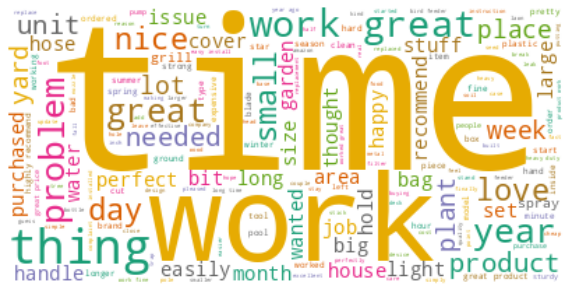



************************************************************
Toys&Games

       index  new_text
0       love     80649
1      great     61942
2        toy     57997
3       year     53611
4       game     52804
5       play     45308
6        kid     42941
7        fun     39524
8        son     32247
9       time     32043
10       set     30732
11  daughter     27363
12         2     24580
13     piece     24030
14     child     23621
15   quality     20595
16         3     19651
17     month     18731
18     color     18533
19      easy     18321


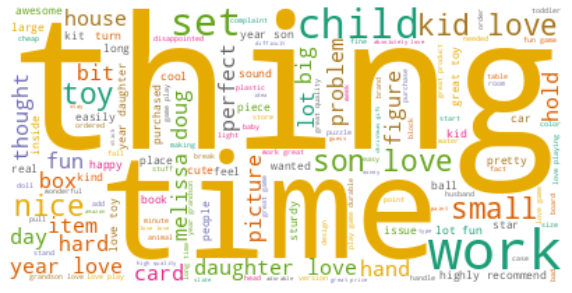



************************************************************
PersonalTransport

      index  new_text
0     great     61311
1      work     58431
2   product     40904
3       car     35640
4      easy     27629
5      time     27627
6    filter     24451
7     price     23556
8   quality     21060
9      year     20296
10      oil     19432
11  battery     19066
12  install     18073
13  perfect     16798
14        2     15853
15     nice     15019
16   worked     14864
17    light     14846
18    truck     13140
19  problem     12809


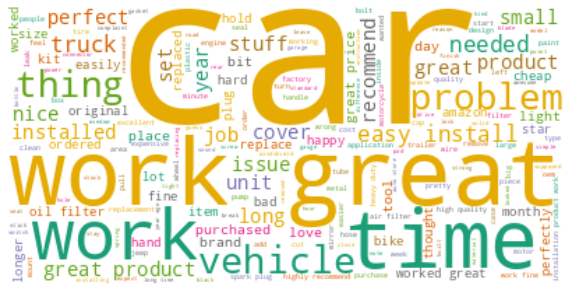



************************************************************
Home&Design

      index  new_text
0     great    143617
1      work    135334
2      time     88323
3      easy     77664
4   product     68118
5      year     67880
6      love     62995
7      tool     53421
8   quality     53245
9      nice     51672
10    price     50884
11    knife     49110
12    thing     46121
13    water     46075
14      set     45030
15        2     43935
16    blade     41383
17      pan     40859
18    small     40839
19    clean     40331


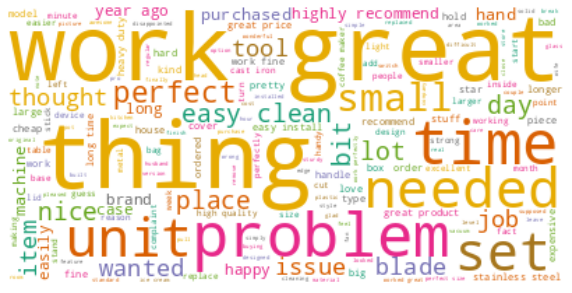



************************************************************
Gadgets

        index  new_text
0       phone    220414
1        case    182261
2       great     76519
3      screen     64019
4        work     62127
5     battery     49748
6        time     45928
7     product     44527
8      iphone     40184
9        love     38573
10     charge     35895
11  protector     33272
12      price     30464
13       nice     29613
14          2     28689
15       easy     27490
16      cover     26816
17    quality     26223
18          5     25937
19    charger     25221


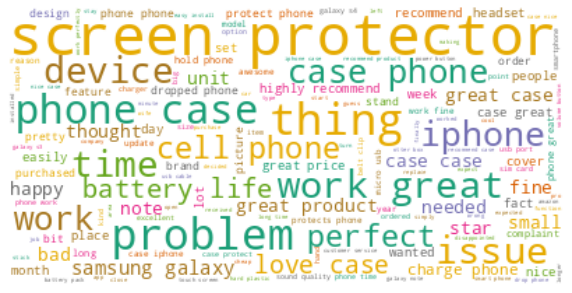



************************************************************
Art&Hobbies

      index  new_text
0     great     52439
1      work     38299
2      love     36880
3     color     32788
4   product     23315
5      nice     20959
6      time     20256
7      easy     20021
8   machine     19158
9     paper     18717
10    price     17535
11     size     17335
12  quality     17095
13  project     16534
14      set     15320
15   needle     15022
16  perfect     14710
17      cut     13634
18     yarn     12593
19    paint     12504


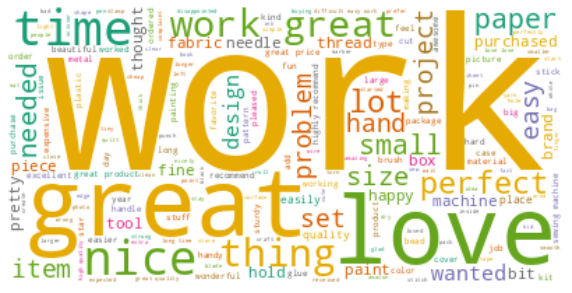



************************************************************
Animals&Pets

      index  new_text
0       dog    135326
1       cat     79949
2      love     79671
3     great     56381
4       toy     49557
5   product     47621
6      work     43276
7      food     40286
8      time     37714
9     water     27812
10     year     25097
11    treat     23766
12      day     23689
13    small     22783
14     tank     21846
15    puppy     21270
16     size     21147
17        2     20301
18     easy     20160
19    month     19193


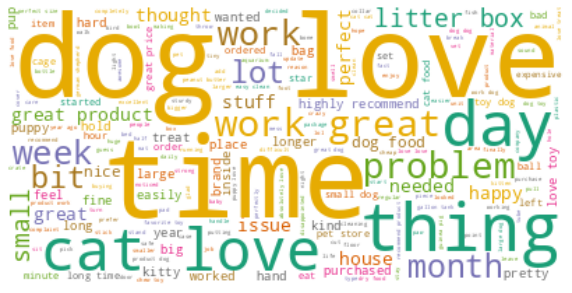



************************************************************
Family&Relationships

           index  new_text
0           time      3882
1   relationship      3834
2           love      3599
3          thing      2741
4           year      2474
5            day      2403
6           life      2376
7          child      2288
8           feel      2278
9         friend      2255
10        people      1835
11        parent      1643
12           kid      1612
13          baby      1557
14          work      1253
15          dont      1194
16          girl      1144
17       feeling      1095
18         month      1095
19          talk      1090


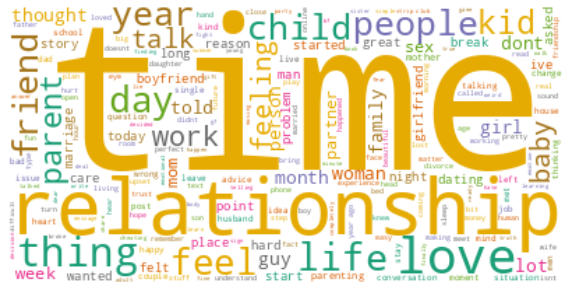



************************************************************
News

         index  new_text
0       people     14711
1         time      6308
2         year      5773
3        thing      5760
4        trump      3684
5        state      3439
6         work      3056
7          law      2959
8        money      2954
9         life      2927
10         lot      2820
11        shit      2813
12         day      2779
13       point      2752
14         guy      2600
15     country      2567
16  republican      2536
17         kid      2514
18      person      2451
19  government      2279


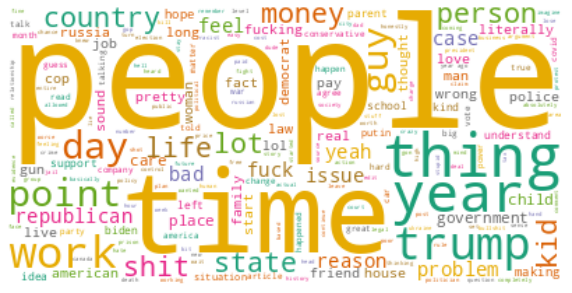



************************************************************
Politics

         index  new_text
0       people      6248
1        trump      2918
2         time      2720
3        thing      2646
4   republican      2595
5        state      2358
6         year      2237
7         vote      1998
8        party      1672
9     democrat      1626
10         law      1412
11       point      1341
12     country      1312
13       money      1289
14        work      1283
15       biden      1282
16  government      1219
17    election      1202
18         lot      1108
19      school      1084


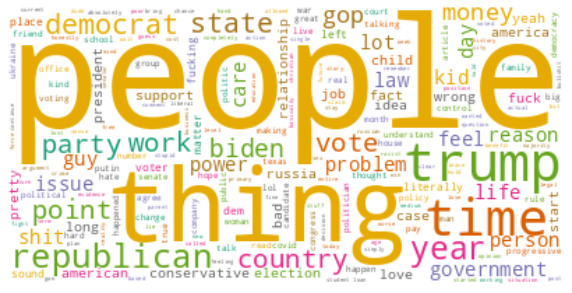



************************************************************
Science&Technology

      index  new_text
0    people     14418
1      year      7299
2      time      7262
3     thing      6392
4      work      5320
5   company      4148
6       lot      3886
7       day      3696
8     study      3671
9     point      3043
10     life      2818
11    money      2775
12  problem      2740
13     long      2716
14      car      2698
15        2      2557
16      pay      2501
17        1      2407
18    issue      2353
19   pretty      2347


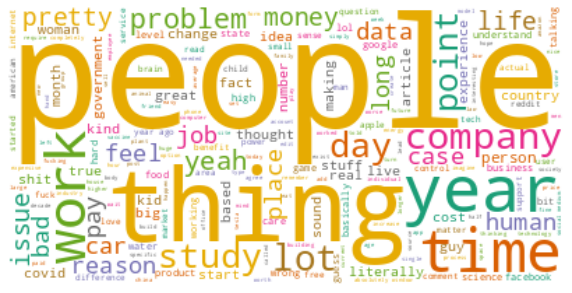



************************************************************
Education

         index  new_text
0      student      4420
1       school      4326
2      college      3350
3    education      3220
4         year      2333
5   university      1646
6         time      1537
7     learning      1502
8         life      1394
9      teacher      1375
10        exam      1237
11       study      1136
12         day      1136
13        2018      1118
14       class      1080
15       child      1013
16        high      1012
17      people       889
18      online       875
19        week       873


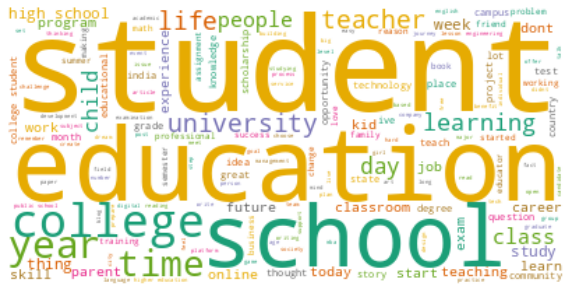

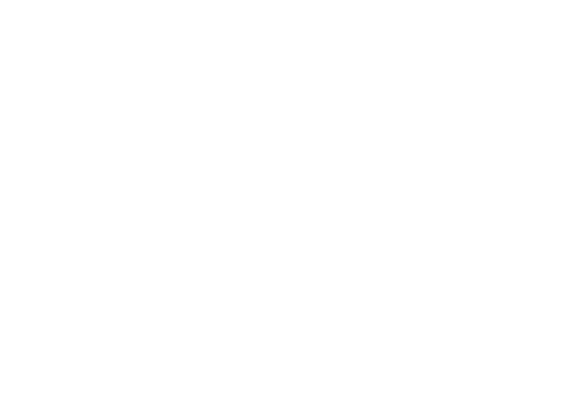

In [50]:
for i in tqdm.tqdm_notebook(topics_):
    print('**'*30)
    print(i)
    print()
    temp = res[res.topic == i]
    print(
        temp.new_text.str.split().explode().value_counts().reset_index().head(20))

    wc = WordCloud(background_color="white", colormap="Dark2", max_font_size=150, random_state=42)

    # set the figure size
    plt.rcParams['figure.figsize'] = [10, 7]
    wc.generate(text= ' '.join(temp.new_text.to_list()))

    ax = plt.imshow(wc, interpolation="bilinear")
    plt.show()
    plt.axis("off")
    print()
    print()

  0%|          | 0/33 [00:00<?, ?it/s]

************************************************************
Celebrities&Events

            index  new_text
0            vote      3838
1          people      3831
2          action      1796
3             bot      1720
4   automatically      1657
5       performed      1642
6            time      1326
7            year      1295
8           thing      1191
9            shit      1127
10          movie       953
11          start       923
12          woman       896
13          music       863
14            man       839
15           fuck       830
16            guy       818
17           hour       807
18           cast       805
19            lol       803


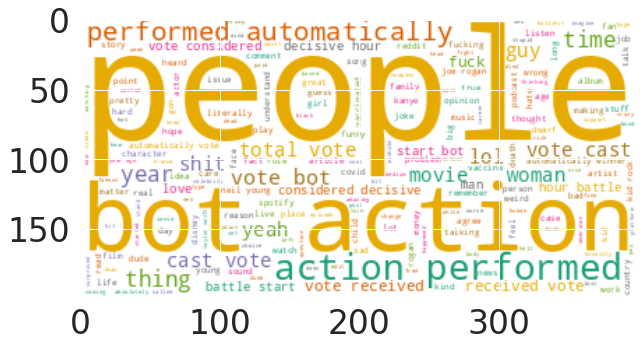



************************************************************
Travel

         index  new_text
0        great      9456
1         room      8877
2        hotel      7659
3      service      7164
4          car      6065
5         time      5865
6        staff      5785
7        place      5114
8         nice      5098
9        clean      4870
10        stay      4826
11    friendly      4037
12     airport      3955
13    location      3486
14  experience      3039
15    customer      2791
16        tour      2750
17        food      2492
18   recommend      2485
19   breakfast      2302


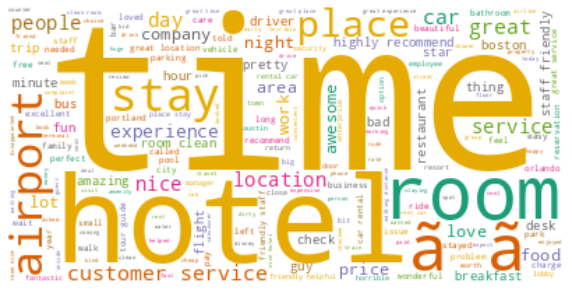



************************************************************
MassTransit

         index  new_text
0         time      1858
1      service      1557
2       driver      1114
3        great      1018
4          bus       824
5         ride       786
6      airport       772
7       flight       750
8       minute       624
9          car       621
10        park       595
11        taxi       594
12        hour       590
13     company       582
14  experience       571
15     airline       560
16       place       553
17         cab       510
18      people       503
19       train       494


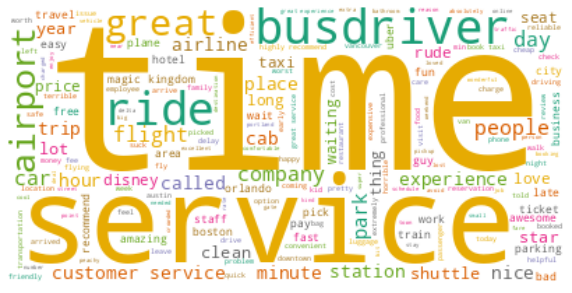



************************************************************
Leisure

         index  new_text
0        great     77983
1         food     77246
2        place     57688
3      service     47972
4        drink     29865
5         time     26632
6          bar     24953
7      amazing     20106
8         nice     19417
9         beer     19067
10       staff     19027
11        love     18906
12   delicious     18018
13    friendly     17877
14  atmosphere     16804
15  restaurant     15341
16       night     13959
17        menu     13788
18     awesome     12277
19   excellent     11948


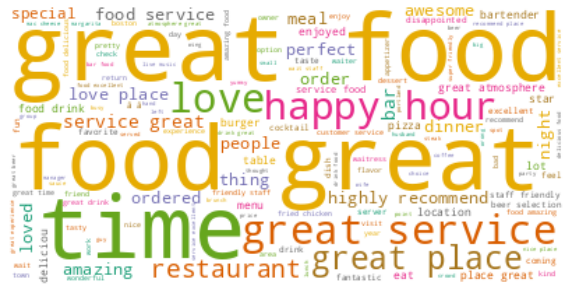



************************************************************
Beauty

         index  new_text
0        great     47238
1         nail     37385
2         hair     33827
3        place     30500
4         time     28111
5        salon     25008
6         love     21337
7      service     20330
8          job     19734
9          cut     18868
10     amazing     17697
11    friendly     17139
12   recommend     16336
13        nice     14840
14       clean     14121
15    pedicure     13173
16  experience     12850
17       staff     12837
18        year     12526
19       color     11852


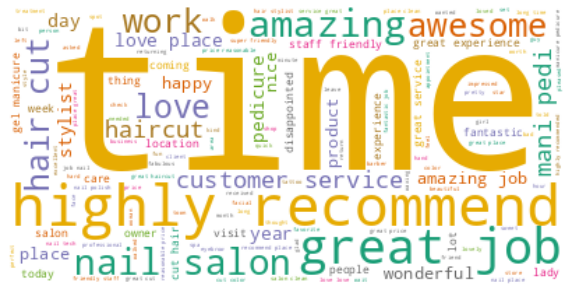



************************************************************
Health&Medicine

           index  new_text
0          great      8171
1          staff      7651
2           time      5831
3      recommend      5026
4          place      4562
5           care      4561
6       friendly      4346
7         doctor      4100
8        massage      4046
9     experience      3753
10       service      3694
11        highly      3459
12        office      3448
13          year      3268
14  professional      3170
15   appointment      3001
16       amazing      2910
17       patient      2636
18          love      2502
19          nice      2438


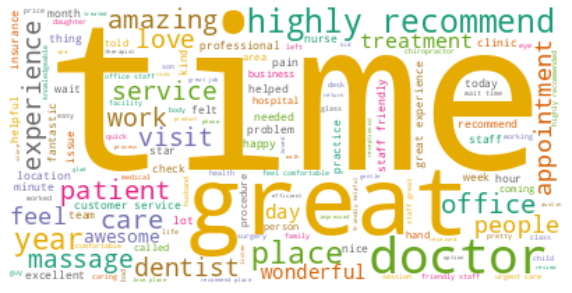



************************************************************
ArtificialIntelligence

       index  new_text
0      model      1919
1       data      1384
2   learning      1324
3         ai      1265
4      paper      1224
5       work      1170
6       code      1004
7       time       912
8      image       861
9    problem       752
10         1       653
11    people       619
12      link       613
13     thing       609
14  training       591
15       lot       575
16  question       558
17   project       528
18     point       527
19         2       509


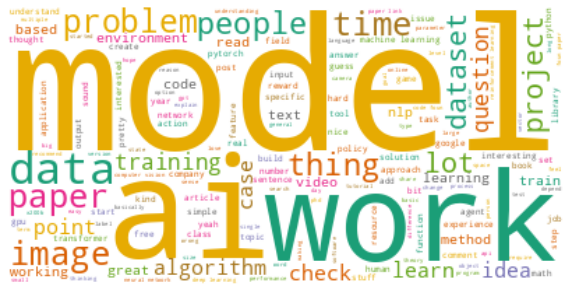



************************************************************
Depression

      index  new_text
0      feel      8330
1      life      7843
2      kill      4963
3       die      4921
4      time      4288
5    people      4251
6   suicide      4152
7       day      3518
8   fucking      3379
9    friend      3289
10    thing      3126
11     year      2944
12     talk      2807
13     live      2709
14     hate      2607
15  thought      2569
16     care      2314
17    tired      2262
18  feeling      2166
19     fuck      2161


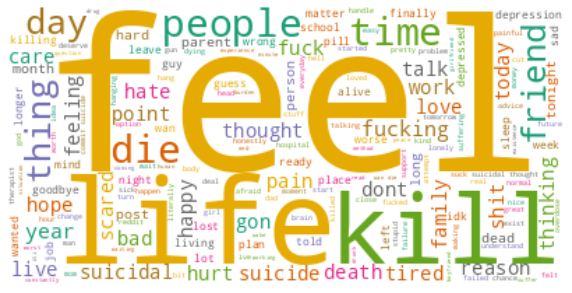



************************************************************
Disasters

        index  new_text
0      people      3960
1        time      3131
2        year      2484
3       thing      2301
4       video      2158
5       plane      1663
6    building      1649
7       water      1606
8         day      1501
9         car      1475
10        lot      1367
11       shit      1354
12       yeah      1273
13        guy      1269
14     pretty      1253
15      train      1223
16  explosion      1212
17       work      1175
18   happened      1113
19      pilot      1072


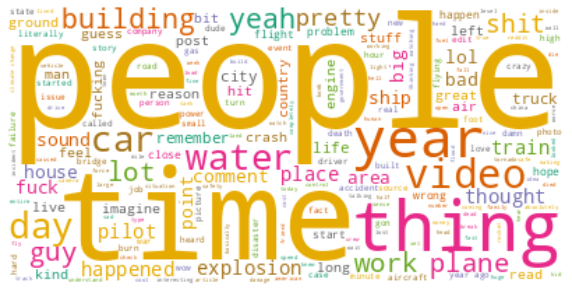



************************************************************
Finance

         index  new_text
0       people      2663
1        money      1481
2         year      1445
3    inflation      1143
4       market      1079
5         time      1025
6        price       942
7         work       926
8      company       860
9          pay       838
10       thing       800
11         job       773
12         tax       752
13        rate       720
14  government       678
15       china       648
16       stock       628
17     economy       575
18         lot       556
19        bank       532


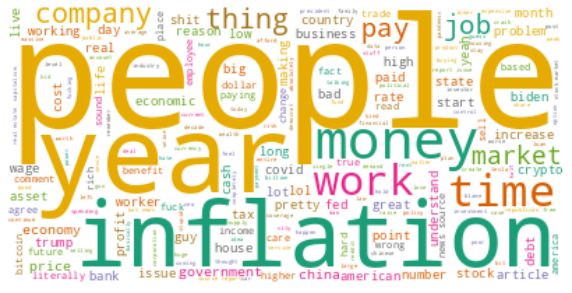



************************************************************
Job

         index  new_text
0          job      9329
1         work      6032
2      company      4533
3         time      4144
4       people      4020
5         year      3277
6    interview      2318
7          day      2318
8   experience      2281
9        thing      2172
10         pay      2005
11         lot      1825
12        week      1699
13     working      1670
14     manager      1599
15    employee      1589
16        feel      1540
17        hour      1513
18    position      1453
19        role      1403


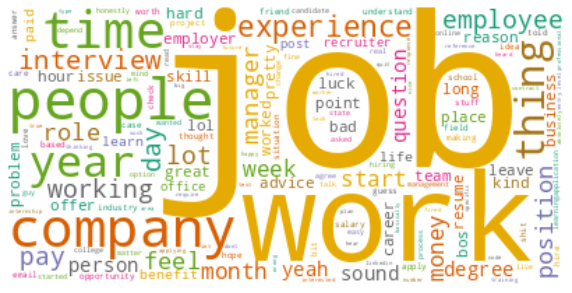



************************************************************
Psychology

         index  new_text
0       people      2216
1        thing      1212
2         work      1207
3         time      1174
4   psychology      1117
5        study      1099
6          lot       837
7         feel       774
8     behavior       760
9     question       656
10        year       645
11      social       632
12        read       621
13        bcba       620
14  experience       614
15      person       572
16        hour       550
17        life       531
18      school       524
19     article       502


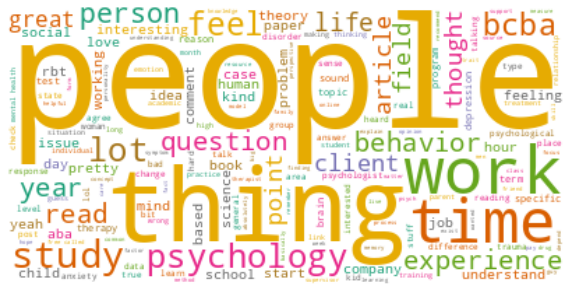



************************************************************
Religion

        index  new_text
0         god     33740
1      people     18220
2       jesus     12054
3   christian     11933
4       thing     10211
5       bible      9880
6      church      9759
7    religion      8430
8        time      8421
9        life      6923
10        sin      6222
11       love      5533
12      faith      5198
13       read      5187
14   question      5163
15     christ      4924
16      point      4528
17   catholic      4526
18       year      4511
19     belief      4381


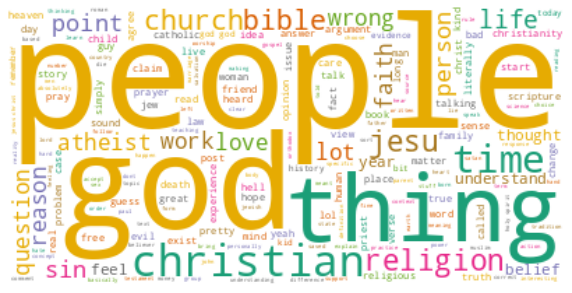



************************************************************
Space

       index  new_text
0     launch     15765
1     spacex     12976
2       time     11746
3   starship     11270
4      space     10554
5     engine      7938
6       year      7758
7      thing      7588
8     people      6838
9    landing      6697
10    rocket      6584
11      nasa      6514
12    flight      6281
13      work      5727
14     orbit      5674
15   booster      5523
16         2      5441
17       mar      5273
18         1      5212
19     earth      5048


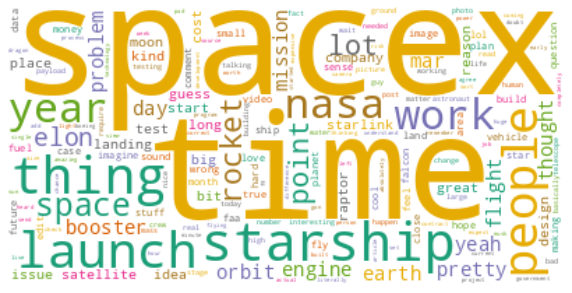



************************************************************
Music

       index  new_text
0       song     84940
1      great     82688
2      album     57213
3       love     44287
4      music     42217
5      sound     37234
6     guitar     26813
7       time     26260
8       work     25959
9      price     16467
10      nice     16274
11    string     15986
12   quality     15898
13  favorite     14507
14      rock     14003
15      year     13821
16      band     13638
17    listen     13037
18       fan     12064
19   classic     11639


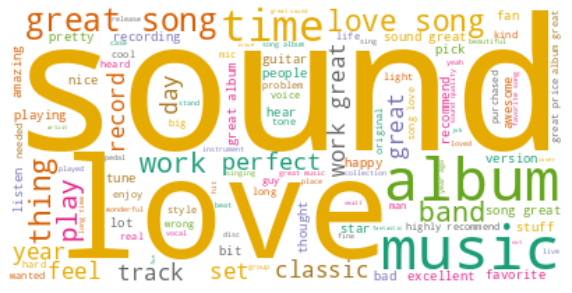



************************************************************
Movies&Tv

        index  new_text
0       movie    103932
1       great     39649
2        love     23283
3        film     22948
4        time     21070
5       story     17067
6       watch     16268
7     classic     13066
8         dvd     12410
9    favorite      9610
10       year      9208
11      funny      7655
12       star      7608
13      loved      7527
14        fun      7365
15      actor      7348
16   watching      7330
17  character      7283
18     acting      7218
19        kid      6395


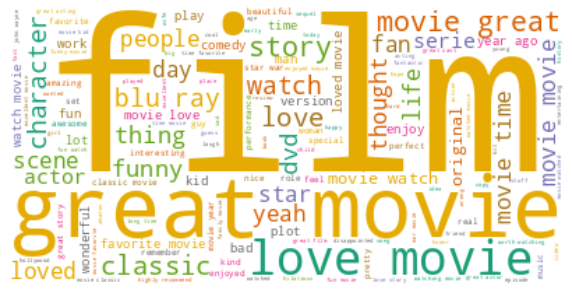



************************************************************
Sports

          index  new_text
0          game      2710
1          year      2651
2          team      2561
3          yeah      2005
4        season      1509
5        player      1301
6          play      1011
7          time      1000
8           nfl       975
9         great       966
10          win       960
11          lot       702
12          fan       683
13     football       675
14        super       656
15         bowl       655
16          guy       543
17       pretty       509
18        watch       495
19  quarterback       490


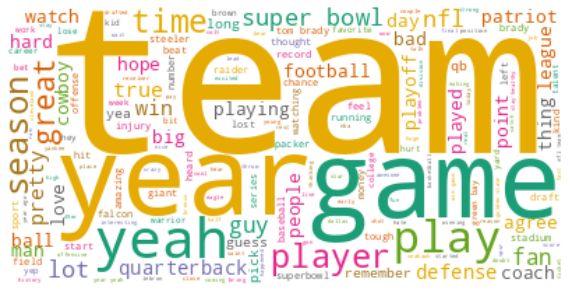



************************************************************
Clothes

          index  new_text
0         great     40726
1          size     38783
2          shoe     33339
3          love     32989
4          wear     30962
5   comfortable     26533
6          pair     18920
7         color     17492
8       quality     17348
9          nice     17238
10        shirt     15121
11      perfect     15088
12         time     14392
13         work     13689
14         year     13583
15      ordered     12946
16         foot     12249
17        small     12224
18        price     12033
19         pant     11008


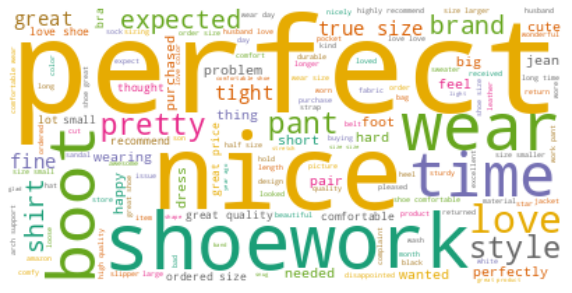



************************************************************
Food

        index  new_text
0       great     34285
1       taste     30917
2        love     27290
3         tea     25473
4      flavor     24919
5     product     17753
6       price     12096
7        time     10760
8      coffee      9604
9   delicious      8518
10        bag      8071
11       nice      7595
12   favorite      7509
13      sugar      7482
14      brand      7146
15      fresh      6962
16      store      6919
17        add      6685
18     amazon      6357
19        eat      6123


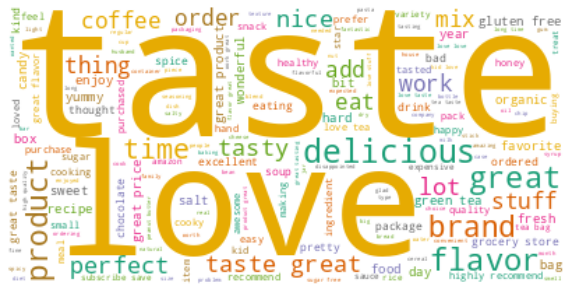



************************************************************
Books&Literature

          index  new_text
0          book    257642
1          read    150502
2         story    120970
3         great     65959
4          love     60962
5     character     57037
6        series     51802
7       reading     46162
8          time     37191
9       enjoyed     32687
10       author     31496
11        loved     30264
12      written     23895
13    recommend     22454
14  interesting     19869
15         life     19214
16        short     19187
17         wait     17829
18          lot     15867
19          fun     15124


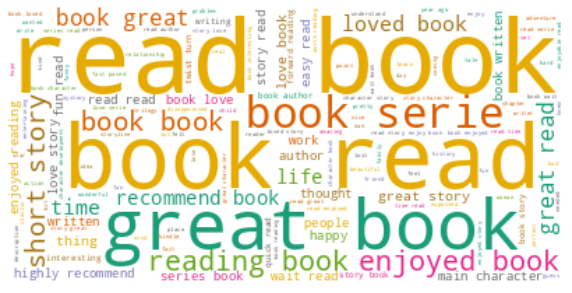



************************************************************
Videogames

         index  new_text
0         game    113677
1        great     29427
2         play     26024
3          fun     20160
4         love     16269
5         time     15704
6         work     13627
7      playing     10535
8      graphic      9494
9       played      8914
10           2      8324
11         lot      8297
12  controller      7517
13      player      7212
14        year      7199
15       story      6833
16       thing      6551
17           3      6267
18        team      5941
19      people      5761


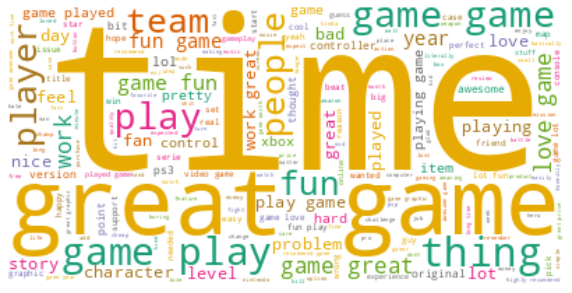



************************************************************
Garden

      index  new_text
0     great     29376
1      work     28321
2   product     16118
3      easy     14636
4      year     12050
5      time     11777
6      love     10216
7     price      9703
8     water      8994
9     plant      8626
10     nice      8401
11  quality      8157
12     hose      7037
13     pool      6894
14     bird      6708
15    cover      6127
16  perfect      6099
17    grill      5962
18    small      5886
19        2      5877


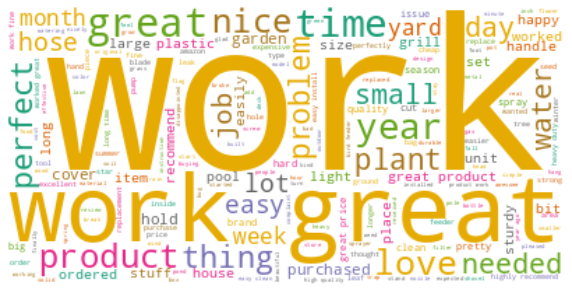



************************************************************
Toys&Games

       index  new_text
0       love     48733
1      great     36258
2       year     27705
3        toy     23365
4        kid     20993
5        fun     20429
6       play     19693
7       game     18457
8        son     15433
9   daughter     13815
10       set     12299
11      time     12256
12   quality     11567
13         2     10600
14      cute     10362
15      gift      9967
16      nice      9622
17      easy      9297
18     loved      9160
19     child      9080


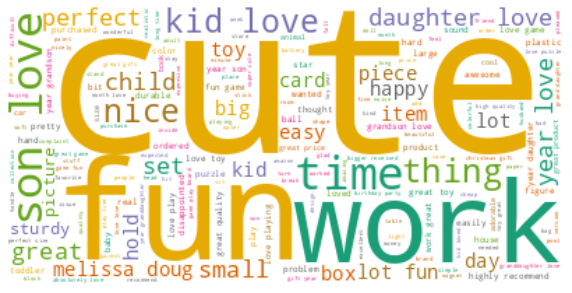



************************************************************
PersonalTransport

        index  new_text
0       great     38785
1        work     33154
2     product     20979
3        easy     17371
4         car     15087
5       price     13654
6      filter     12869
7     quality     12374
8        time     12138
9     install     10913
10    perfect     10338
11       year      9347
12        oil      8736
13     worked      8640
14       nice      8558
15    battery      7329
16      light      6622
17  perfectly      6571
18  installed      6468
19      truck      6441


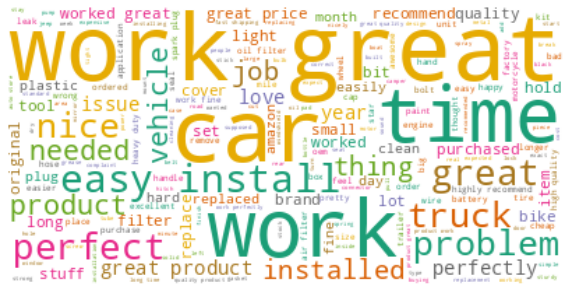



************************************************************
Home&Design

      index  new_text
0     great     82645
1      work     68409
2      easy     41533
3      love     35929
4   product     31738
5      time     30530
6      nice     27109
7   quality     26861
8     price     24812
9      year     24259
10  perfect     21538
11     tool     20026
12     size     18960
13    knife     18081
14    clean     17531
15      set     16814
16    small     16353
17      pan     15788
18    light     15115
19    thing     14772


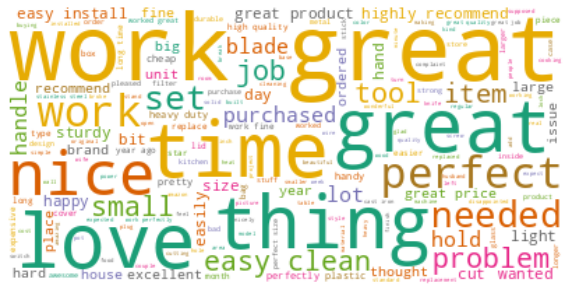



************************************************************
Gadgets

        index  new_text
0       phone     77915
1        case     71584
2       great     43016
3        work     29013
4        love     24245
5     product     21295
6      screen     20538
7        time     16280
8       price     16136
9        nice     14176
10     iphone     13833
11    battery     12746
12       easy     12675
13     charge     11654
14  recommend     11378
15      cover     11179
16  protector     11002
17    quality     11000
18      color     10932
19    perfect      9252


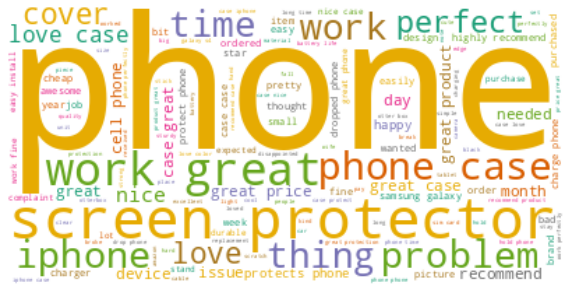



************************************************************
Art&Hobbies

      index  new_text
0     great     33535
1      love     23308
2      work     21976
3     color     17698
4   product     13228
5      easy     12379
6      nice     12370
7   quality     10212
8     price     10188
9      time      9801
10     size      9472
11  project      9363
12  perfect      9238
13    paper      9037
14   needle      7214
15  machine      7011
16      cut      6819
17     yarn      6512
18      lot      6432
19      set      6409


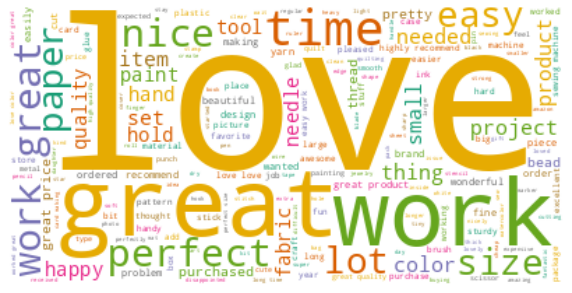



************************************************************
Animals&Pets

      index  new_text
0       dog     65696
1      love     47761
2     great     34091
3       cat     33734
4       toy     24164
5   product     22835
6      work     22142
7      food     16275
8      time     14514
9     treat     11984
10    puppy     11516
11     easy     10754
12    small     10467
13    price     10390
14     year     10102
15    water     10095
16     size      9984
17     tank      9001
18      day      8476
19     ball      7910


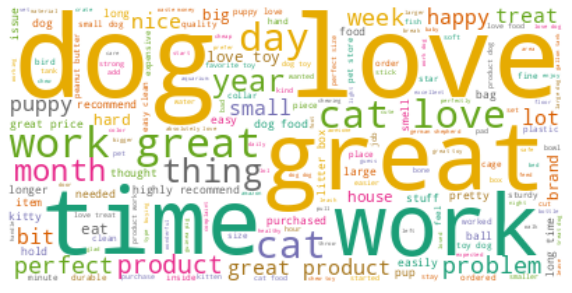



************************************************************
Family&Relationships

           index  new_text
0           love      2630
1   relationship      2414
2           time      2232
3          child      2113
4           life      1819
5            day      1636
6           year      1528
7           baby      1485
8          thing      1445
9         parent      1398
10           kid      1380
11        people      1271
12          dont       994
13        friend       950
14          feel       841
15         woman       757
16        family       729
17          work       680
18        dating       672
19           mom       666


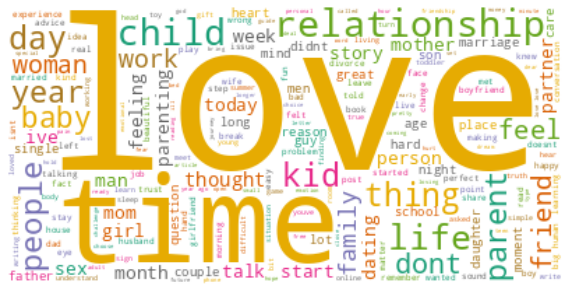



************************************************************
News

         index  new_text
0       people      7574
1         time      3146
2         year      2968
3        thing      2845
4        trump      2088
5        state      1688
6         shit      1650
7        money      1553
8          law      1512
9         work      1491
10  republican      1470
11         day      1442
12        life      1436
13         guy      1414
14         lot      1357
15     country      1357
16       point      1336
17         kid      1261
18        yeah      1173
19  government      1169


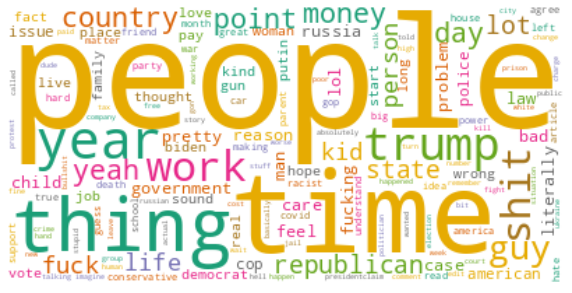



************************************************************
Politics

         index  new_text
0       people      3088
1        trump      1652
2   republican      1486
3         time      1309
4        thing      1191
5        state      1136
6         year      1099
7         vote      1039
8     democrat       861
9        party       859
10       biden       748
11         law       709
12     country       668
13    election       652
14       money       649
15       point       632
16         gop       614
17  government       608
18      russia       569
19        work       562


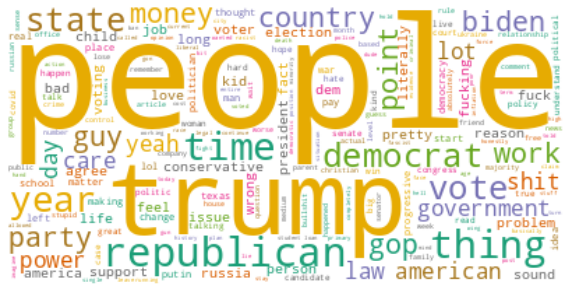



************************************************************
Science&Technology

      index  new_text
0    people      7358
1      year      3747
2      time      3613
3     thing      3144
4      work      2666
5   company      2189
6       lot      1960
7       day      1802
8     study      1776
9     money      1451
10    point      1418
11     yeah      1413
12     long      1370
13     life      1352
14      car      1348
15  problem      1341
16   pretty      1334
17      pay      1231
18    covid      1170
19        2      1153


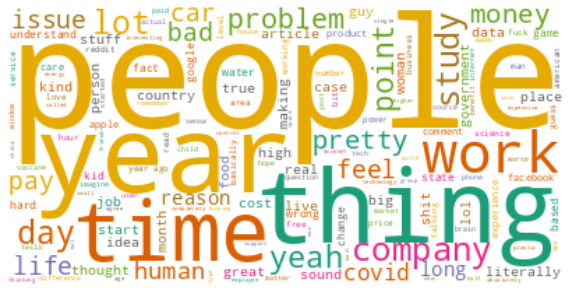



************************************************************
Education

         index  new_text
0      student      4393
1       school      4290
2      college      3288
3    education      3167
4         year      2315
5   university      1627
6         time      1523
7     learning      1467
8         life      1376
9      teacher      1356
10        exam      1235
11         day      1124
12       study      1118
13        2018      1110
14       class      1073
15        high      1009
16       child      1001
17      people       880
18      online       870
19        week       862


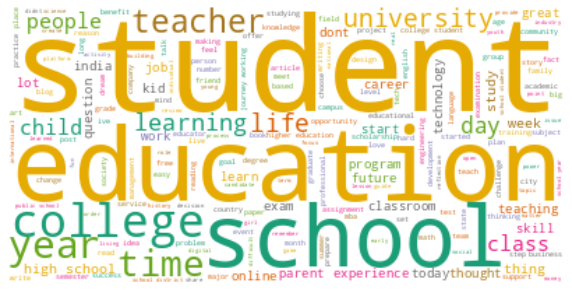

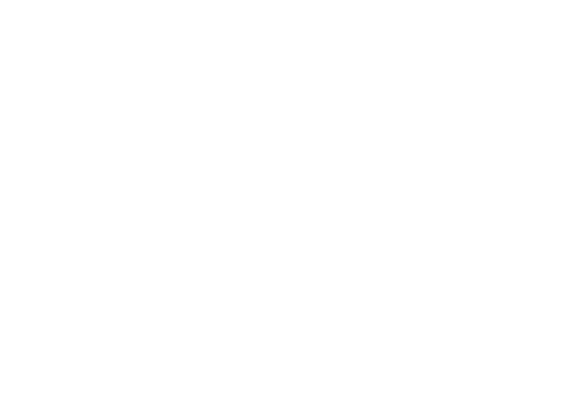

In [66]:
for i in tqdm.tqdm_notebook(topics_):
    print('**'*30)
    print(i)
    print()
    temp = test[test.topic == i]
    print(
        temp.new_text.str.split().explode().value_counts().reset_index().head(20))

    wc = WordCloud(background_color="white", colormap="Dark2", max_font_size=150, random_state=42)

    # set the figure size
    plt.rcParams['figure.figsize'] = [10, 7]
    wc.generate(text= ' '.join(temp.new_text.to_list()))

    ax = plt.imshow(wc, interpolation="bilinear")
    plt.show()
    plt.axis("off")
    print()
    print()

In [3]:
%%time
df = pd.read_csv('./dataset-train-data/dataset_v6.csv')

CPU times: user 28.2 s, sys: 3.35 s, total: 31.5 s
Wall time: 59.2 s


In [8]:
s = df.groupby('topic')['source'].apply(np.unique)

In [10]:
s.shape

(33,)

In [13]:
df.

,text,topic,origin_topic,source
0,Peter Dinklage faces backlash from dwarf commu...,Celebrities&Events,entertainment,celebs-reddit.csv
1,Amazon and Apple Music flaunt support for Neil...,Celebrities&Events,entertainment,celebs-reddit.csv
2,Miss USA 2019 Cheslie Kryst Dead at 30 from Su...,Celebrities&Events,entertainment,celebs-reddit.csv
3,Kanye West 'spreading rumour Pete Davidson has...,Celebrities&Events,entertainment,celebs-reddit.csv
4,Janet Jackson Forgives Justin Timberlake for S...,Celebrities&Events,entertainment,celebs-reddit.csv
...,...,...,...,...
6349592,MoMA in Conference. This series of posts celeb...,Education,['education'],medium
6349593,Seneca dedicates No Place for Hate display. Th...,Education,['education'],medium
6349594,Apple # - iPod by #. iPod by #,Education,['education'],medium
6349595,Grenloch Terrace Early Childhood Center classr...,Education,['education'],medium


In [11]:
s

topic
Animals&Pets                                                       [amazon]
Art&Hobbies                                                        [amazon]
ArtificialIntelligence         [comments-reddit.csv, title-body-reddit.csv]
Beauty                                           [amazon, yelp_5topics.csv]
Books&Literature                                        [amazon, circa.csv]
Celebrities&Events        [celebs-reddit.csv, comments-reddit.csv, title...
Clothes                      [amazon, self-dialogue.csv, women-clothes.csv]
Depression                [comments-reddit.csv, depression.csv, title-bo...
Disasters                      [comments-reddit.csv, title-body-reddit.csv]
Education                                                          [medium]
Family&Relationships      [medium, reddit-body-news-politics-relation, r...
Finance                        [comments-reddit.csv, title-body-reddit.csv]
Food                                          [amazon, circa.csv, multiwoz]
Gadget